In [2]:
import math, random
import time
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.autograd as autograd 
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns 
from gym.spaces import Discrete, Box
import pandas as pd 
import os
import gym
from gym import logger as gymlogger
from gym.wrappers.record_video import RecordVideo
gymlogger.set_level(40)
from tqdm import tqdm
import matplotlib
import glob
import io
import base64
%matplotlib inline
import warnings
warnings.filterwarnings("ignore") 

#from newenv import RLIAEnv
from newenv import RLIAEnv 
import random

/home/adrian/.local/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
USE_CUDA = torch.cuda.is_available()
Variable = lambda *args, **kwargs: autograd.Variable(*args, **kwargs).cuda() if USE_CUDA else autograd.Variable(*args, **kwargs)

In [4]:
from collections import deque

class ReplayBuffer(object):
    def __init__(self, capacity):
        self.buffer = deque(maxlen=capacity)                            
    def push(self, state, action, reward, next_state, done):            
        state      = np.expand_dims(state, 0)                           
        next_state = np.expand_dims(next_state, 0)                      
        self.buffer.append((state, action, reward, next_state, done))
    def sample(self, batch_size):
        state, action, reward, next_state, done = zip(*random.sample(self.buffer, batch_size))    
        return np.concatenate(state), action, reward, np.concatenate(next_state), done
    def __len__(self):                  
        return len(self.buffer) 

In [5]:
replay_buffer = ReplayBuffer(1000)

In [6]:
class DQN(nn.Module):                                                         
    def __init__(self, num_actions, num_states):                                          
        super(DQN, self).__init__()
        self.layers = torch.nn.Sequential(
            torch.nn.Linear(num_states, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, 32),
            torch.nn.ReLU(),
            torch.nn.Linear(32, num_actions))                                    
            
    def forward(self, x):                                                    
        if type(x) is not torch.Tensor:
            x = torch.tensor(x)
        y = self.layers(x.float())
                                          
        return y      

In [7]:
eval_model = DQN(num_actions=env.action_space.n, num_states=4)
target_model  = DQN(num_actions=env.action_space.n, num_states=4)

if USE_CUDA:
    eval_model = eval_model.cuda()
    target_model  = target_model.cuda()

optimizer = optim.Adam(eval_model.parameters(), lr= 0.001)

NameError: name 'env' is not defined

In [8]:
def choose_action(state, epsilon):
    nmm =np.random.rand()
    print(nmm, epsilon, nmm<epsilon)
    state   = Variable(torch.FloatTensor(state).unsqueeze(0), volatile=True) 
    if ( nmm< epsilon):
        #print("EXPLOIT!")                                                          
        q_value = eval_model.forward(state)                               
        action = q_value.argmax().item()                 
        #print(action)
    else:                                                                                
        action = np.random.randint(int(env.action_space.n), size=1)[0]   
        #print("EXPLORE!")
        #print(action)                    
    return action                  

In [9]:
epsilon_initial = 1.0      

epsilon_by_frame = lambda x: pow((epsilon_initial - 0.001), x)

In [10]:
def compute_td_loss(batch_size, gamma):
    state, action, reward, next_state, done = replay_buffer.sample(
        batch_size)  # Sample from buffer

    state = Variable(torch.FloatTensor(np.float32(state)))
    next_state = Variable(torch.FloatTensor(np.float32(next_state)))
    action = Variable(torch.LongTensor(action))
    reward = Variable(torch.FloatTensor(reward))
    done = Variable(torch.FloatTensor(done))

    # Policy network.
    q_policy = eval_model(state)
    q_policy = q_policy.gather(1, action.unsqueeze(1)).squeeze(1)

    # Q values from the target network for the next state
    q_target_next = target_model(next_state)
    q_target_next = q_target_next.max(1)[0].detach()
    q_target = reward + gamma * (1 - done) * q_target_next

    loss_f = nn.MSELoss()
    loss = loss_f(q_policy, q_target) 
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    return loss


In [11]:
def update_target(eval_net, target_net):
    global eval_model
    global target_model
    target_model.load_state_dict(eval_model.state_dict())

In [12]:
#put the offline_data.csv file into a dataframe
import pandas as pd
df = pd.read_csv('offline_data.xlsx', header=None)
df.columns = ['episode', 'rss', 'preid', 'angle', 'action', 'reward']
#df.head()
#print the rows which the action is 7 by 7
df[df['action'] == '7by7']
#print the rows which the action is exhaustive
#df[df['action'] == 'exhaustive']


,episode,rss,preid,angle,action,reward
1,0,-51.848405,32,0.000000,7by7,0.000081
5,0,-51.848405,32,0.000000,7by7,0.000081
8,0,-51.848405,32,0.000000,7by7,0.000081
9,0,-51.848405,32,0.000000,7by7,0.000081
14,1,-51.848405,32,0.000000,7by7,0.000081
...,...,...,...,...,...,...
40085,3,-32.925409,32,3.814075,7by7,-20.155245
40090,4,-42.463388,32,21.801409,7by7,-25.878033
40093,4,-32.983900,32,7.594643,7by7,-20.190340
40094,4,-32.347969,32,11.309932,7by7,-19.808781


In [14]:
#save the last 20,000 episodes of the offline_data.xlsx file into a new pandas dataframe
df2 = df.tail(20000)
df2.head()


,episode,rss,preid,angle,action,reward
20100,5,-32.983900,32,7.594643,7by7,-20.190340
20101,5,-32.347969,32,11.309932,9beam,-19.608781
20102,5,-33.620971,32,14.931417,25beam,-20.472583
20103,5,-34.200278,32,18.434949,exhaustive,-21.120167
20104,5,-42.463388,32,21.801409,7by7,-25.878033


In [21]:
#offline learning environment
import pandas as pd

class OfflineRLIAEnv:
    def __init__(self, dataframe):
        self.action_space = Discrete(4)
        self.data = dataframe
        self.current_index = 0
        self.state = (0, 0, 0, 0)
        self.reward = 0

    def step(self, action):
        straction = ''

        if action == 2:
            straction = '7by7'
        elif action == 0:
            straction = '9beam'
        elif action == 1:
            straction = '25beam'
        elif action == 3:
            straction = 'exhaustive'
        # Find the row in the dataset that matches the current action
        action_data = self.data[self.data['action'] == straction]

        # If there's no matching data, return the current state and zero reward
        if action_data.empty:
            return self.state, 0, True, {}

        # Select the next available row for this action
        row = action_data.iloc[self.current_index % len(action_data)]
        self.current_index += 1

                # Update the state based on the data row
        if row['action'] == '7by7':
            mech = 3
        elif row['action'] == '9beam':
            mech = 0
        elif row['action'] == '25beam':
            mech = 1
        elif row['action'] == 'exhaustive':
            mech = 2

        # Update the state based on the data row
        self.state = (row['rss'], row['preid'], row['angle'], mech)


        reward = row['reward']

        return self.state, reward, False, {}

    def reset(self):
        self.current_index = 0
        self.state = (0, 0, 0, 0)
        return self.state

offline_env = OfflineRLIAEnv(df2)


def main():
    test_state = offline_env.reset()
    for _ in range(10): 
        action = '7by7'  
        state, reward, done, _ = offline_env.step(action)
        print(f"State: {state}, Reward: {reward}")
        if done:
            break

if __name__ == "__main__":
    main()


State: (0, 0, 0, 0), Reward: 0


In [22]:
#initialize environment
env = OfflineRLIAEnv(df2) 

In [23]:
#create eval and target models
eval_model = DQN(num_actions=offline_env.action_space.n, num_states=4)
target_model  = DQN(num_actions=offline_env.action_space.n, num_states=4)

if USE_CUDA:
    eval_model = eval_model.cuda()
    target_model  = target_model.cuda()

optimizer = optim.Adam(eval_model.parameters(), lr= 0.001)

In [43]:
#offline training script
episodes = 6000 
batch_size = 32 
GAMMA = 0.7  
losses = []                   
NETWORK_UPDATE_PERIOD = 50  


for episode in range(episodes):
    state = env.reset()
    episode_reward = 0  

    for step in range(10): 
        epsilon = 0.7  
        # epsilon = epsilon_by_frame(episode * 10 + step)

        print(f"Episode: {episode}, Step: {step}, Epsilon: {epsilon}")

        action = choose_action(state, epsilon)  
        print("THis is my action: ", action)
        next_state, reward, done, _ = env.step(action) 

        print("This is my next state: ", next_state, " Done: ", done)
        replay_buffer.push(state, action, reward, next_state, done)  

        print("Reward: ", reward)
        print("                   ")
        state = next_state
        episode_reward += reward

        if len(replay_buffer) > batch_size: 
            loss = compute_td_loss(batch_size, GAMMA)
            losses.append(loss.item())  

        # update target network using eval network
        if step % NETWORK_UPDATE_PERIOD == 0:
            update_target(eval_model, target_model)

    print(f"Episode {episode} finished with reward: {episode_reward}")


Episode: 0, Step: 0, Epsilon: 0.7
0.9085261248444584 0.7 False
THis is my action:  0
This is my next state:  (-32.34796883902524, 32, 11.309932474020211, 0)  Done:  False
Reward:  -19.608781303415142
                   
Episode: 0, Step: 1, Epsilon: 0.7
0.5258973508618253 0.7 True
THis is my action:  3
This is my next state:  (-31.848404919107026, 32, 0.0, 2)  Done:  False
Reward:  -19.709042951464216
                   
Episode: 0, Step: 2, Epsilon: 0.7
0.6842875218311909 0.7 True
THis is my action:  1
This is my next state:  (-32.92540910821277, 32, 3.8140748342903534, 1)  Done:  False
Reward:  -20.055245464927665
                   
Episode: 0, Step: 3, Epsilon: 0.7
0.06163607119130177 0.7 True
THis is my action:  1
This is my next state:  (-32.98389968349271, 32, 7.594643368591445, 1)  Done:  False
Reward:  -20.090339810095625
                   
Episode: 0, Step: 4, Epsilon: 0.7
0.1801094291158568 0.7 True
THis is my action:  0
This is my next state:  (-31.848404919107026, 32, 0.0

In [28]:
#pandas dataframe to save the measurements
kind_experiment = { 
    0: "Random",
    1: "Exhaustive search",
    2: "DDQN",
}

chosen_strategy = { 
    0: "9x9",
    1: "25x25",
    2: "7x7",
    3: "Exhaustive search",
}

actions = ["9beam", "25beam", "7by7", "exhaustive"]

def appendToDf(df, type, ts_begin, ts_end, spectral_efficiency, episode, reward, strategy, distance, cbsp, angle):
    df.loc[len(df)] = [type, kind_experiment[type],ts_begin, ts_end, ts_end-ts_begin, spectral_efficiency, episode, reward, strategy, chosen_strategy[strategy], distance, cbsp, angle]



measurements = pd.DataFrame(columns=["type",  "type_str",
                  "ts_begin", "ts_end", "ts_diff", "spectral_efficiency", "episode", "reward", "strategy", "strategy_str", "distance", "CBSP", "angle"])



In [30]:
from newenv import RLIAEnv 
testenv = RLIAEnv() 

In [51]:

#test the trained model

epinum = 0
type_measurement = 2
print('TESTING')
for i in range(2000):
    ts_begin = time.process_time()
    q_value = target_model.forward(state)                               
    action = q_value.argmax().item()      
    # action = choose_action(state, 1)
    state, reward, done, _ = testenv.step(action)
    print("action: ", actions[action])
    print("reward: ", reward)
    print("uecloc: ", testenv.ue_loc)
    print("\n                       ")
    ts_end = time.process_time()
    epinum = epinum+1
    #only save measurements where env.ue_loc[1] does not equal -1
    if testenv.ue_loc[1] != -1:
        appendToDf(df=measurements, type=type_measurement,ts_begin=ts_begin, ts_end=ts_end, spectral_efficiency=state[0], episode = epinum, reward=reward, strategy=int(action), distance=state[3], cbsp = testenv.cbsp, angle=testenv.state[2])
    
env.close()

TESTING
action:  25beam
reward:  -25.778033083789794
uecloc:  [15, 6]

                       
action:  25beam
reward:  -19.409042951464215
uecloc:  [15, 0]

                       
action:  25beam
reward:  -20.055245464927662
uecloc:  [15, 1]

                       
action:  25beam
reward:  -20.090339810095625
uecloc:  [15, 2]

                       
action:  25beam
reward:  -19.708781303415144
uecloc:  [15, 3]

                       
action:  25beam
reward:  -20.472582584382923
uecloc:  [15, 4]

                       
action:  25beam
reward:  -22.373652189569434
uecloc:  [15, 5]

                       
action:  25beam
reward:  -25.778033083789794
uecloc:  [15, 6]

                       
action:  25beam
reward:  -19.409042951464215
uecloc:  [15, 0]

                       
action:  25beam
reward:  -20.055245464927662
uecloc:  [15, 1]

                       
action:  25beam
reward:  -20.090339810095625
uecloc:  [15, 2]

                       
action:  25beam
reward:  -19.708781

AttributeError: 'OfflineRLIAEnv' object has no attribute 'close'

In [52]:
#save the measurements in a csv file
measurements.to_csv("measurements.csv")

In [53]:
#grouping data by strategy type
grouped = measurements.groupby(['type', 'strategy', 'strategy_str']).sum()

In [ ]:
#get the number of times a particular strategy and put the two measurement types in a multi layered bar chart where the y is the number of times the strategy was used and the x is the measurement type


grouped['count'] = measurements.groupby(['type', 'strategy', 'strategy_str']).size()

pivot_table = grouped.pivot_table(index='type', columns='strategy_str', values='count', fill_value=0)

# Plot the bar graph and instead of labeling the bars 1 and 2 label them exhaustive and SBM
ax = pivot_table.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.xlabel('Exhaustive   Vs   OM')
plt.ylabel('Number of episodes')
plt.title('offlinemech vs Exhaustive search strategy count')
plt.legend(title='Strategy_Str', loc='upper right')
plt.xticks(rotation=0)
plt.show()

print(grouped['count'])

In [ ]:
#make the same graph as above with a legend
exhaustive = measurements.query("type == 1")
ddqn = measurements.query("type == 2")
g = sns.lineplot(data=ddqn,x="angle", y="reward", label="DDQN")
g.set(ylabel="Reward", xlabel="angle", title="Recieved signal strength as angle increases")
plt.show(g)

#save the graph in your local directory
g.figure.savefig("CBSP.png")


In [ ]:
#graph my loss function
plt.plot(losses)
plt.show()


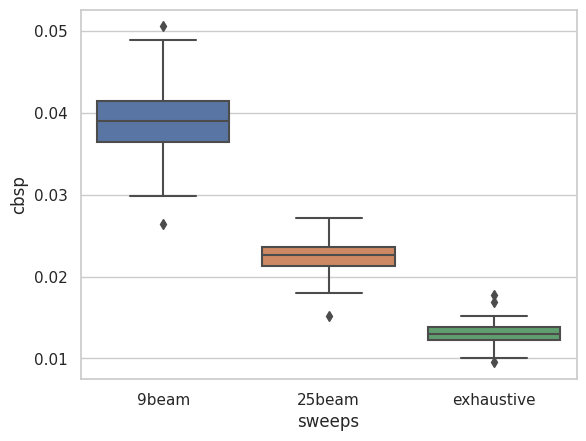

In [ ]:
ax = sns.boxplot(x ='sweeps',y='cbsp', data=df_box)

In [ ]:
#training my online agent
Nreplay_buffer = ReplayBuffer(1000)  
num_frames = 10000                       
batch_size = 64                           
GAMMA = 0.9                      
NETWORK_UPDATE_PERIOD = 50      

episodes = 2000 
DQNlosses = []
all_rewards = []
episode_reward = 0

beam9stren = []
beam25stren = []
beamexhaustivestren = []

actions = ["9beam", "25beam", "exhaustive"]


for i in range(episodes):
    state = onlineenv.reset()
    for i in range(10):
        epsilon = .7
        #epsilon = epsilon_by_frame(i)
        print("epsilon: ", epsilon)
        print(onlineenv.ue_loc)
        action = choose_action(state, epsilon)                
        next_state, reward, done, _ = onlineenv.step(
            action)         
        print("This is my next state: ", done)
        Nreplay_buffer.push(state, action, reward, next_state,
                        done)   
        print("reward", reward)
        print("                   ")
        state = next_state
        episode_reward += reward
        if len(replay_buffer) > batch_size:                             
            DQNloss = compute_td_loss(batch_size, GAMMA, DQNeval_model) 
            DQNlosses.append(loss.cpu().data.numpy())
    print("episode finished!!!!!!!")

In [ ]:
#testing my online agent
epinum = 0
type_measurement = 2
print('TESTING')
for i in range(2000):
    ts_begin = time.process_time()
    q_value = DQNeval_model.forward(state)                               
    action = q_value.argmax().item()      
    # action = choose_action(state, 1)
    state, reward, done, _ = env.step(action)
    print("action: ", actions[action])
    print("reward: ", reward)
    print("uecloc: ", env.ue_loc)
    print("\n                       ")
    ts_end = time.process_time()
    epinum = epinum+1
   
    if env.ue_loc[1] != -1:
        appendToDf(df=measurements, type=type_measurement,ts_begin=ts_begin, ts_end=ts_end, spectral_efficiency=state[0], episode = epinum, reward=reward, strategy=int(action), distance=state[3], cbsp = env.cbsp, angle=env.state[2])
    
env.close()